In [652]:
import modules.ident as ident
import cv2
from matplotlib import pyplot as plt
import numpy as np
import ipywidgets as widgets
import modules.helpers as h
import glob
import os
from IPython.display import Image as IPyImage
from matplotlib.patches import Circle
from skimage import draw
from scipy.signal import find_peaks
import importlib 
importlib.reload(modules.ident)
importlib.reload(modules.helpers)

%matplotlib ipympl
plt.style.use(['seaborn-paper','science'])
plt.ioff()

In [646]:
data_folder = 'data'
# h.list_files(data_folder)

In [647]:
SeeAllFiles = True

In [648]:
sub_dir = './data/oct8/second'
sci_peak_data_dir = sub_dir+os.sep+"sci_peak_data"
pickle_dir = sub_dir+os.sep+"obj"

all_files = glob.glob(f"{sub_dir+os.sep}[!C_]*.JPG") ## Use regex to avoid C_ files

if SeeAllFiles == True:
    Ofiles = all_files
else:
    Ofiles = [f for f in all_files if os.path.basename(f).replace("JPG",'pkl') not in os.listdir(pickle_dir)]

f = lambda x: IPyImage(filename = x,width = 400, height = 200)
wi = widgets.interact(f, x = Ofiles)

interactive(children=(Dropdown(description='x', options=('./data/oct8/second/30_4.JPG', './data/oct8/second/9_…

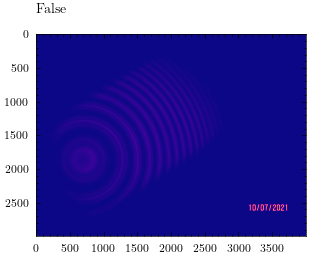

In [711]:
del(profiler)
fname = wi.widget.kwargs['x']
f_string = os.path.basename(fname)

fig = plt.figure()
ax = fig.add_subplot(1,1,1)
im = cv2.imread(fname).astype(np.float32)
ax.imshow(im[:,:,-1],cmap = 'plasma')
profiler = ident.Identifier(ax)
profiler.connect()
fig.show()

In [712]:
profiler.export()

array([[ 712.77373925, 1880.03072469],
       [2595.04730983,  929.2309833 ]])

In [713]:
pos_dict = dict()

p1,p2 = profiler.export()
p1 = list(map(round,p1)) ; pos_dict['p1'] = np.array(p1);
p2 = list(map(round,p2)) ; pos_dict['p2'] = np.array(p2);
image = cv2.line(im.copy(), p1, p2, (255, 255, 255), 2)
line = np.transpose(np.array(draw.line(*p1,*p2)))
data = im.copy()[line[:, 1], line[:, 0], 2]
dist = np.array([np.sqrt((p[0]-p1[0])**2+(p[1]-p1[1])**2) for p in line])
## Change the dist range
sel = dist > 450
data = data[sel]
dist = dist[sel]


#### Quickly extract the peaks and export the plot into sci_peaks folder

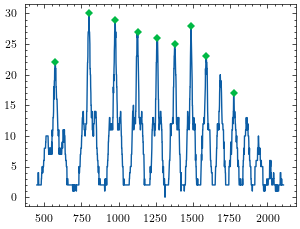

In [714]:
plt.close()
fig = plt.figure()
sci_peaks, _ = find_peaks(data, height = 15, distance = 90,prominence=(0.7, None))
plt.plot(dist, data)
plt.plot(dist[sci_peaks], data[sci_peaks], "D", ms = 4)
fig = plt.gcf()
plt.show()

try:
    os.mkdir(sub_dir+os.sep+"sci_peaks")
except FileExistsError:
    pass

fig.savefig(sub_dir+os.sep+'sci_peaks'+os.sep + 'Sci_'+f_string.replace('JPG','pdf'),format= 'pdf', bbox_inches = 'tight')


#### Use similar logic to find sections to fit

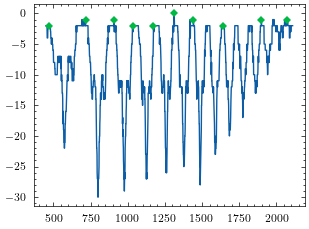

In [715]:
plt.close()
fig = plt.figure()
sci_troughs, _ = find_peaks(-data, height = -2, distance = 90,prominence=(.8, None))
plt.plot(dist, -data)
plt.plot(dist[sci_troughs], -data[sci_troughs], "D", ms = 4)
ax = plt.gca()
fig.show()

#### Only use the first four rings that could be resolved

In [716]:
for idx in range(4):
    center = dist[sci_peaks[idx]]
    left = dist[sci_troughs[idx]]
    right = dist[sci_troughs[idx+1]]
    ## Export left_center_right arrays to dictionary for futher fitting
    pos_dict[idx] = np.array([left,center,right])

In [717]:
try:
    os.mkdir(sci_peak_data_dir)
except FileExistsError:
    pass

f_no_extension = f_string[:f_string.find('.')]
np.save(sci_peak_data_dir + os.sep + f_no_extension+'_data.npy', data)
np.save(sci_peak_data_dir + os.sep + f_no_extension+'_dist.npy', dist)

In [718]:
try:
    os.mkdir(pickle_dir)
except FileExistsError:
    pass

h.save_obj(pos_dict,f_string.replace('.JPG',''),directory= pickle_dir)

In [719]:
h.load_obj(f_string.replace('.JPG',''),directory= pickle_dir)

{'p1': array([ 713, 1880]),
 'p2': array([2595,  929]),
 0: array([470.47210332, 573.78131723, 715.99581004]),
 1: array([715.99581004, 800.07312166, 906.51089348]),
 2: array([ 906.51089348,  977.17193983, 1033.07308551]),
 3: array([1033.07308551, 1128.3306253 , 1173.05157602])}